In [35]:
import os
import torch
import torchvision
from torchvision.io import read_image
import torchvision.transforms.functional
from torchvision.utils import draw_bounding_boxes
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xmltodict
from collections import defaultdict

In [36]:
# Path to data folders
image_folder = "D:\\Visiolab\\Tomato_detection\\data\\archive\\images\\"
bbox_folder = "D:\\Visiolab\\Tomato_detection\\data\\archive\\annotations\\"

In [37]:
# Check for non-png files in the image folder and non xml files in the annotation folder
all_png_files = os.listdir(image_folder)
non_png_files = [file for file in all_png_files if not file.endswith('.png')]

all_xml_files = os.listdir(bbox_folder)
non_xml_files = [file for file in all_xml_files if not file.endswith('.xml')]

if non_png_files:
    print("The following files do not have a .png extension:")
    for file in non_png_files:
        print(file)
else:
    print("All files have a .png extension.")

if non_xml_files:
    print("The following files do not have a .xml extension:")
    for file in non_xml_files:
        print(file)
else:
    print("All files have a .xml extension.")

All files have a .png extension.
The following files do not have a .xml extension:
.~lock.tomato1.xml#


In [38]:
# Default values for XML parameters
default_values = {
    'name': 'tomato',
    'pose': 'Unspecified',
    'truncated': '0',
    'occluded': '0',
    'difficult': '0'
}

In [39]:
# Initialize lists and dictionaries to store data
image_sizes = defaultdict(int)  # defaultdict automatically initializes new keys with a default value. Here any new key(image_sizes[(400, 500)]) will be initialized with the integer 0.
non_default_values = defaultdict(lambda: defaultdict(set)) #

In [40]:
# Count the number of image files and XML files
num_image_files = len(all_png_files)
num_xml_files = len(all_xml_files)

print(f"Number of image files: {num_image_files}")
print(f"Number of XML files: {num_xml_files}")

if num_image_files != num_xml_files:
    print("Warning: The number of image files does not match the number of XML files.")

Number of image files: 895
Number of XML files: 896


## Some more manually random quality checks lead to following discoveries:
<br><font size="3">  1. The images have different sizes. <font><br>
<br><font size="3"> 2. The ground truth of the bounding boxes i.e object detection is not perfect with cases of missed bounding boxes for tomatoes or 2 tomatoes clubbed together in 1 bounding box etc. being seen <font><br>





In [41]:
# Initialize lists to store data for plotting
num_objects_per_image = []
bounding_box_sizes = []

In [42]:
# Function to extract bounding box data from xml
def extract_bounding_boxes(xml_file):
    with open(xml_file) as f:
        data = xmltodict.parse(f.read())            # Reads the XML file and parses it into a Python dictionary using the xmltodict
    objects = data['annotation'].get('object',[])   # Retrieves the 'object' field from the 'annotation' section of the parsed XML & if 'object' doesn't exist, it returns an empty list
    if not isinstance(objects, list):
        objects = [objects]                         # ensures objects is always a list, even if there's only one object in the XML.
    bounding_boxes = []
    for obj in objects:
        bbox = obj['bndbox']
        xmin = int(bbox['xmin'])
        ymin = int(bbox['ymin'])
        xmax = int(bbox['xmax'])
        ymax = int(bbox['ymax'])
        bounding_boxes.append((xmin, ymin, xmax, ymax))
        
    return bounding_boxes
    

In [43]:
# Function to display image
def show(imgs):
    if not isinstance(imgs, list):          # Checks if the input imgs is a list. If it's not, it wraps the single image in a list
        imgs = [imgs]
        
    fig, axs = plt.subplots(ncols = len(imgs), squeeze=False)   # squeeze=False ensures that axs is always a 2D array, even when there's only one subplot.
    
    for i, img in enumerate(imgs) :         
        img = img.detach()                                      # Detaches the image tensor from its computation graph
        img = torchvision.transforms.functional.to_pil_image(img)      # Converts the image tensor to a PIL image, necessary for displaying with matplotlib.             
        axs[0,i].imshow(img)
        axs[0,i].set(xticklabels=[], yticklabels=[], xticks=[], yticks= [])

In [44]:
# Counter for objects
object_counter = 0

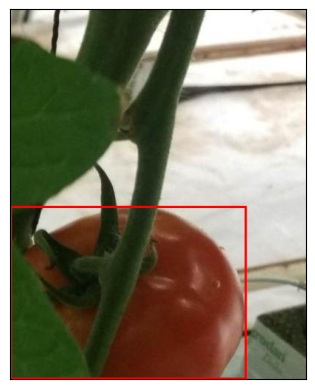

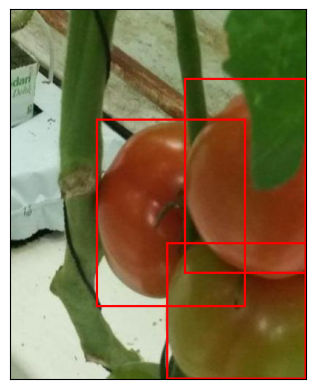

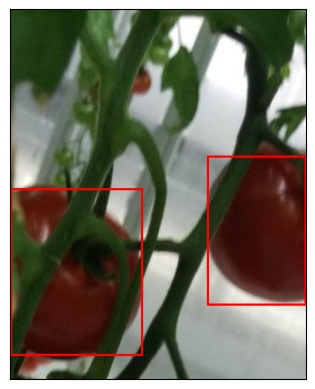

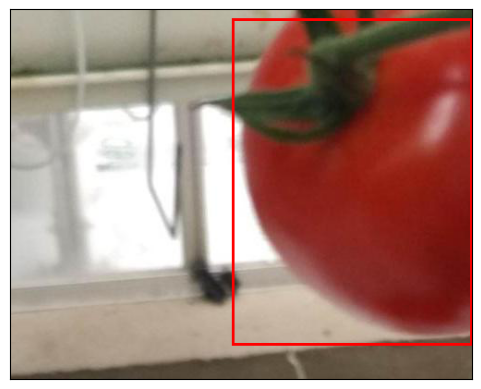

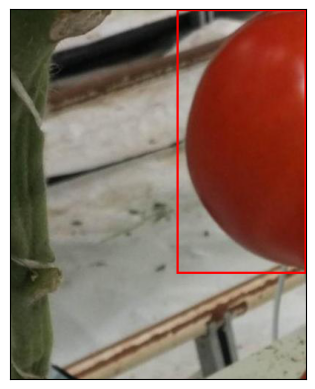

...

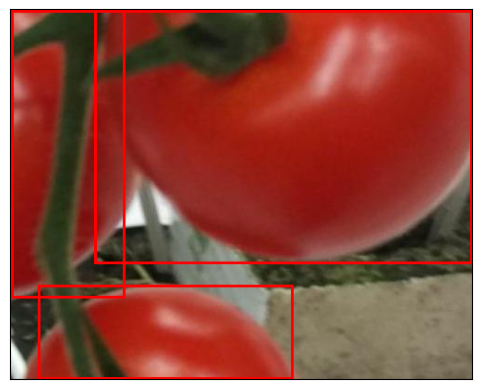

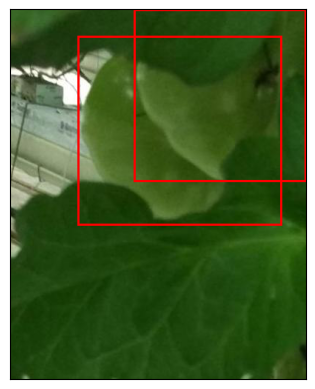

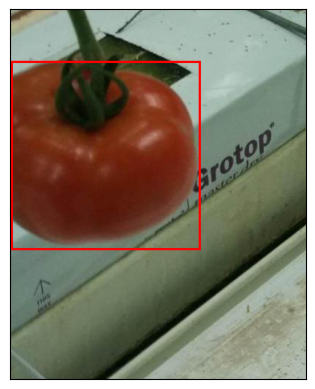

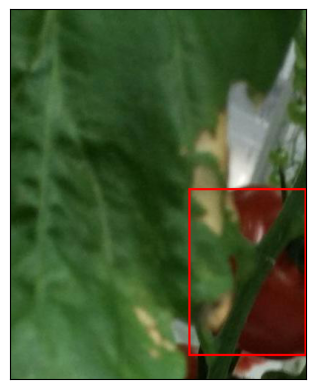

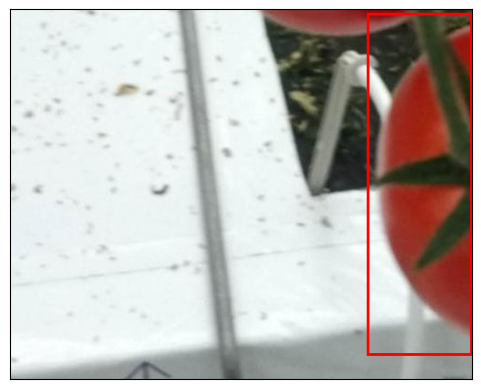

In [47]:
# Iterate through images and corresponding XML files
for image_file in os.listdir(image_folder):
    if image_file.endswith('.png'):
        image_path = os.path.join(image_folder, image_file)         # Creates the full path to the image file
        xml_file = os.path.splitext(image_file)[0] + '.xml'         # Extracts the filename without the extension and appends '.xml' to it
        xml_path = os.path.join(bbox_folder, xml_file)
        
        if os.path.exists(xml_path):
            bounding_boxes = extract_bounding_boxes(xml_path)       # Extracts bounding boxes from the XML file using the function defined earlier
            num_objects_per_image.append(len(bounding_boxes))       # Appends the number of objects(bbox's) in the image to the list
            box_tensor = torch.tensor(bounding_boxes, dtype=torch.int) # Converts the list of bounding boxes to a pytorch tensor
            
            for (xmin, ymin, xmax, ymax) in bounding_boxes:         # Iterates through the bounding boxes and calculates the width and height of each box
                width = xmax - xmin
                height = ymax - ymin
                bounding_box_sizes.append((width, height))
                object_counter += 1                                 # Increments the object counter

            # Read image and draw bounding boxes
            img = read_image(image_path)                        # Reads the image file using the read_image function from torchvision#
            img_with_boxes = draw_bounding_boxes(img, box_tensor, colors="red", width=3)    # Draws bounding boxes on the image using the draw_bounding_boxes function from torchvision

                       
            # Display the image with bounding boxes for every 10th object
            if object_counter % 100 == 0:
            # if (object_counter % 100 == 0) or (len(bounding_boxes)  > 40):
            # if (width > 200) or (height > 200):
                show(img_with_boxes)
                plt.show()


             # Record image size
            image_size = img.shape[1], img.shape[2]  # (Height, Width)
            image_sizes[image_size] += 1


In [20]:
# Check for different image sizes
if len(image_sizes) > 1:
    print("Different image sizes found:")
    for size, count in image_sizes.items():
        print(f"Size: {size}, Count: {count}")
else:
    print("All images are of the same size.")

# Check for non-default XML parameter values
for param, values in non_default_values.items():
    if values:
        print(f"\nNon-default values for {param}:")
        for value, files in values.items():
            print(f"Value: {value}, Files: {', '.join(files)}")

Different image sizes found:
Size: (500, 400), Count: 546
Size: (400, 500), Count: 349


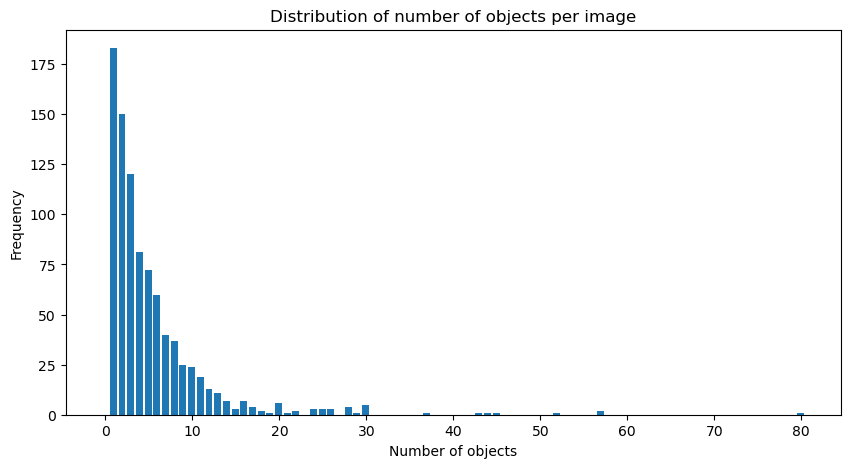

In [24]:
# Plot distribution of number of objects per image

plt.figure(figsize=(10,5))
plt.hist(num_objects_per_image, bins= range(0,max(num_objects_per_image)+2), align='left', width=0.8)
plt.title('Distribution of number of objects per image')
plt.xlabel('Number of objects')
plt.ylabel('Frequency')
plt.show()

In [26]:
# Calculate and display the percentage distribution as a table
object_counts = pd.Series(num_objects_per_image).value_counts().sort_index()
percentages = (object_counts / len(num_objects_per_image)) * 100
table_data = pd.DataFrame({'Number of Objects': object_counts.index, 'Percentage': percentages.values})

print("\nPercentage Distribution of Number of Objects per Image:")
print(table_data)


Percentage Distribution of Number of Objects per Image:
    Number of Objects  Percentage
0                   1   20.446927
1                   2   16.759777
2                   3   13.407821
3                   4    9.050279
4                   5    8.044693
5                   6    6.703911
6                   7    4.469274
7                   8    4.134078
8                   9    2.793296
9                  10    2.681564
10                 11    2.122905
11                 12    1.452514
12                 13    1.229050
13                 14    0.782123
14                 15    0.335196
15                 16    0.782123
16                 17    0.446927
17                 18    0.223464
18                 19    0.111732
19                 20    0.670391
20                 21    0.111732
21                 22    0.223464
22                 24    0.335196
23                 25    0.335196
24                 26    0.335196
25                 28    0.446927
26                 29    

In [31]:
object_counts = pd.Series(num_objects_per_image).value_counts().sort_index(ascending=False)
object_counts

80      1
57      2
52      1
45      1
44      1
43      1
37      1
30      5
29      1
28      4
26      3
25      3
24      3
22      2
21      1
20      6
19      1
18      2
17      4
16      7
15      3
14      7
13     11
12     13
11     19
10     24
9      25
8      37
7      40
6      60
5      72
4      81
3     120
2     150
1     183
Name: count, dtype: int64

## Inferences
<br><font size="3"> 1. Most images have only 1 object with around 20.5%. Around 50% of the images have between 1 and 3 objects.</font><br>
<br><font size="3"> 2. There is a general decreasing trend in the percentage as the number of objects increases. This suggests that images with fewer objects are more prevalent in the dataset.</font><br>
<br><font size="3"> 3. Images with a high number of objects (e.g., 20 or more) are relatively rare, each contributing less than 1% to the dataset. This suggests that highly cluttered images are uncommon.</font><br>
<br><font size="3"> 4. The distribution has a long tail, with a few images containing a very high number of objects (e.g., 80 objects). These outliers may require special attention during model training and evaluation.</font><br>

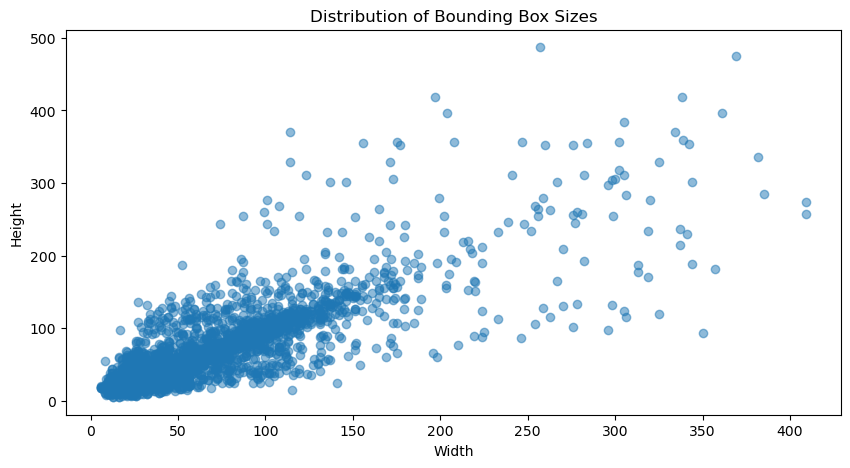

In [18]:
# Plot distribution of bounding box sizes

widths, heights = zip(*bounding_box_sizes)
plt.figure(figsize=(10,5))
plt.scatter(widths, heights, alpha=0.5)
plt.title('Distribution of Bounding Box Sizes')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

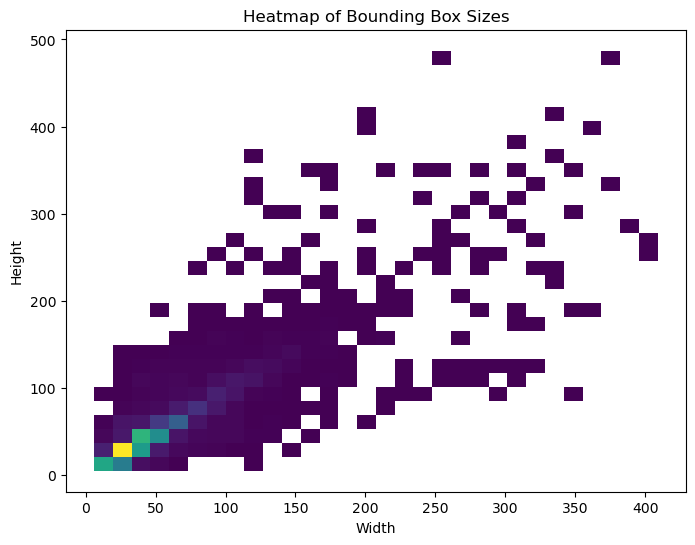

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Heatmap for Joint Distribution of Widths and Heights
plt.figure(figsize=(8, 6))
sns.histplot(x=widths, y=heights, bins=30, cmap='viridis')
plt.title('Heatmap of Bounding Box Sizes')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

